In [1]:
from ParseSongs import ParseSongs 
import numpy as np
import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import os
import math
import seaborn as sns
import matplotlib.pyplot as plt
import pickle

In [2]:
sns.set()

In [3]:
torch.__version__

'1.2.0'

In [4]:
best_val_loss = np.inf

In [5]:
files = [file for file in os.listdir("Data") if os.path.splitext(file)[1] == ".txt"]

In [6]:
files

['morris.txt',
 'playford.txt',
 'jigs.txt',
 'reelsd-g.txt',
 'hpps.txt',
 'reelsh-l.txt',
 'reelsa-c.txt']

In [7]:
notes = ""
for f in files:
    file = open("Data/" + f,"r")
    data = file.read()
    file.close()
    songs = ParseSongs(data)
    notes += data + "\n\n"
    print(f, len(songs))

morris.txt 31
playford.txt 15
jigs.txt 340
reelsd-g.txt 84
hpps.txt 65
reelsh-l.txt 93
reelsa-c.txt 81


In [8]:
len(notes)

300822

In [9]:
songs = ParseSongs(notes)

In [10]:
len(songs)

709

In [11]:
songs[345].play()

In [12]:
# Find average number of characters in the song
total = 0
for s in songs:
    total += len(str(s))

total / len(songs)

421.2708039492243

In [13]:
# Encode each character to int, and vice versa
chars = tuple(set(notes))
int2char = dict(enumerate(chars))
char2int = {ch: ii for ii, ch in int2char.items()}

In [15]:
int2char_file = open("int2char.pickle","wb")
pickle.dump(int2char, int2char_file)
int2char_file.close()

In [17]:
char2int_file = open("char2int.pickle","wb")
pickle.dump(char2int, char2int_file)
char2int_file.close()

In [16]:
int2char_file = open("int2char.pickle","rb")
int2char_new = pickle.load(int2char_file)
int2char_file.close()
int2char_new

{0: 'Q',
 1: 'T',
 2: 'f',
 3: 'J',
 4: '*',
 5: 'h',
 6: 'm',
 7: ':',
 8: 'v',
 9: '=',
 10: '_',
 11: 'G',
 12: 'E',
 13: ',',
 14: '@',
 15: '(',
 16: 'n',
 17: 'D',
 18: '#',
 19: ')',
 20: 'u',
 21: '/',
 22: '-',
 23: 'j',
 24: ']',
 25: '[',
 26: 'A',
 27: 'O',
 28: '<',
 29: 'F',
 30: 'r',
 31: 'M',
 32: '8',
 33: 'd',
 34: '%',
 35: '3',
 36: '?',
 37: 'V',
 38: 'p',
 39: '4',
 40: 'U',
 41: 'c',
 42: '\\',
 43: 'S',
 44: '&',
 45: '9',
 46: '\n',
 47: 'e',
 48: 'P',
 49: '!',
 50: 'B',
 51: 'o',
 52: 'H',
 53: '~',
 54: 'q',
 55: '+',
 56: 'k',
 57: '>',
 58: '"',
 59: '2',
 60: '5',
 61: '}',
 62: 'C',
 63: 'w',
 64: 'i',
 65: 'X',
 66: 'g',
 67: '1',
 68: 'N',
 69: '|',
 70: 'Y',
 71: 'K',
 72: ' ',
 73: 'y',
 74: 'z',
 75: 'b',
 76: '6',
 77: '0',
 78: 'I',
 79: 's',
 80: "'",
 81: 'L',
 82: 'a',
 83: 'W',
 84: '^',
 85: '{',
 86: 't',
 87: 'R',
 88: 'x',
 89: '7',
 90: '.',
 91: 'l'}

In [26]:
set([1,2,3])

{1, 2, 3}

In [ ]:
Or

In [18]:
int2char

{0: 'Q',
 1: 'T',
 2: 'f',
 3: 'J',
 4: '*',
 5: 'h',
 6: 'm',
 7: ':',
 8: 'v',
 9: '=',
 10: '_',
 11: 'G',
 12: 'E',
 13: ',',
 14: '@',
 15: '(',
 16: 'n',
 17: 'D',
 18: '#',
 19: ')',
 20: 'u',
 21: '/',
 22: '-',
 23: 'j',
 24: ']',
 25: '[',
 26: 'A',
 27: 'O',
 28: '<',
 29: 'F',
 30: 'r',
 31: 'M',
 32: '8',
 33: 'd',
 34: '%',
 35: '3',
 36: '?',
 37: 'V',
 38: 'p',
 39: '4',
 40: 'U',
 41: 'c',
 42: '\\',
 43: 'S',
 44: '&',
 45: '9',
 46: '\n',
 47: 'e',
 48: 'P',
 49: '!',
 50: 'B',
 51: 'o',
 52: 'H',
 53: '~',
 54: 'q',
 55: '+',
 56: 'k',
 57: '>',
 58: '"',
 59: '2',
 60: '5',
 61: '}',
 62: 'C',
 63: 'w',
 64: 'i',
 65: 'X',
 66: 'g',
 67: '1',
 68: 'N',
 69: '|',
 70: 'Y',
 71: 'K',
 72: ' ',
 73: 'y',
 74: 'z',
 75: 'b',
 76: '6',
 77: '0',
 78: 'I',
 79: 's',
 80: "'",
 81: 'L',
 82: 'a',
 83: 'W',
 84: '^',
 85: '{',
 86: 't',
 87: 'R',
 88: 'x',
 89: '7',
 90: '.',
 91: 'l'}

In [21]:
len(chars)

92

In [22]:
# Encode the notes
encoded_notes = np.array([char2int[ch] for ch in notes])

In [23]:
encoded_notes[:50]

array([65, 87, 54, 71, 32, 91, 87, 84, 57, 57, 78, 37, 37, 34, 54, 69, 14,
       78, 43, 39, 20, 88, 54, 21, 78, 14, 70, 54, 40, 10, 70, 77, 20, 32,
       27, 54,  3, 78, 37, 37,  5, 70, 83,  6, 10, 43, 54, 15, 79, 34])

In [24]:
class NotesDataset(Dataset):
    def __init__(self,notes,batch_size,seq_length):
        self.batch_size = batch_size
        self.seq_length = seq_length
        total_batch_number = batch_size * seq_length
        # total number of batches we can make
        self.n_batches = notes.shape[0] // total_batch_number
    
        # Keep only enough characters to make full batches
        notes = notes[:self.n_batches * total_batch_number]
        self.notes = notes.reshape((batch_size,-1))
        
    def __getitem__(self,index):
        start = self.seq_length * index
        end = start + self.seq_length
        x = self.notes[:,start:end]
        # The targets, shifted by one
        y = np.zeros_like(x)
        try:
            y[:, :-1], y[:, -1] = x[:, 1:], self.notes[:, end]
        except IndexError:
            y[:, :-1], y[:, -1] = x[:, 1:], self.notes[:, 0]
        return x,y
    def __len__(self):
        return self.n_batches

In [25]:
def get_batches(notes, batch_size, seq_length):    
    total_batch_number = batch_size * seq_length
    # total number of batches we can make
    n_batches = notes.shape[0] // total_batch_number
    
    # Keep only enough characters to make full batches
    notes = notes[:n_batches * total_batch_number]
    notes = notes.reshape((batch_size,-1))
    
    # iterate through the array, one sequence at a time
    for n in range(0, notes.shape[1], seq_length):
        # The features
        x = notes[:, n:n+seq_length]
        # The targets, shifted by one
        y = np.zeros_like(x)
        try:
            y[:, :-1], y[:, -1] = x[:, 1:], notes[:, n+seq_length]
        except IndexError:
            y[:, :-1], y[:, -1] = x[:, 1:], notes[:, 0]
        yield torch.from_numpy(x), torch.from_numpy(y)

**Test**

In [26]:
it = iter(get_batches(encoded_notes,batch_size=10,seq_length=3))
x, y = next(it)

In [27]:
encoded_notes[:20]


array([65, 87, 54, 71, 32, 91, 87, 84, 57, 57, 78, 37, 37, 34, 54, 69, 14,
       78, 43, 39])

In [28]:
x

tensor([[65, 87, 54],
        [72,  0, 20],
        [71, 41, 54],
        [54,  9, 20],
        [15, 10, 14],
        [ 0, 59, 33],
        [38,  0, 54],
        [32, 59, 90],
        [ 0, 84, 38],
        [38,  0, 28]])

In [29]:
y

tensor([[87, 54, 71],
        [ 0, 20, 28],
        [41, 54, 53],
        [ 9, 20, 10],
        [10, 14, 77],
        [59, 33, 59],
        [ 0, 54, 59],
        [59, 90, 59],
        [84, 38,  0],
        [ 0, 28, 59]])

In [30]:
x.shape, y.shape

(torch.Size([10, 3]), torch.Size([10, 3]))

In [31]:
class CharRNN(nn.Module):
    def __init__(self, n_chars):
        super().__init__()
        lstm_input_size = 128 # also output size of embedding layer
        self.hidden_size = 512
        self.num_layers = 2
        dropout = 0.5
        
        self.embed = nn.Embedding(n_chars, lstm_input_size)
        self.lstm = nn.LSTM(input_size=lstm_input_size, hidden_size=self.hidden_size, num_layers=self.num_layers, 
                            dropout=dropout, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.linear = nn.Linear(self.hidden_size, n_chars)
    
    def forward(self,x, hidden):
        x = self.embed(x)
        x, hidden = self.lstm(x,hidden)
        x = self.dropout(x)
        # Stack up LSTM outputs using view
        # we may need to use contiguous to reshape the output
        x = x.contiguous().view(-1, self.hidden_size)
        x = self.linear(x)
        return x, hidden
    
    def init_hidden(self, batch_size):
        ''' Initializes hidden state '''
        # Create two new tensors with sizes n_layers x batch_size x n_hidden,
        # initialized to zero, for hidden state and cell state of LSTM
        weight = next(self.parameters()).data
        h = weight.new(self.num_layers,batch_size,self.hidden_size).zero_()
        c = weight.new(self.num_layers,batch_size,self.hidden_size).zero_()
        if torch.cuda.is_available():
            h = h.cuda()
            c = c.cuda()
        hidden = (h,c)
        return hidden

In [32]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [33]:
batch_size = 10
loader_batch_size = 1
seq_length = 50
val_size = 0.2

In [34]:
val_index = int(len(encoded_notes) * val_size)
train_notes = encoded_notes[:val_index]
valid_notes = encoded_notes[val_index:]

In [35]:
n_epochs = 20
clip = 5

In [36]:
model = CharRNN(len(chars))
model.to(device)

CharRNN(
  (embed): Embedding(92, 128)
  (lstm): LSTM(128, 512, num_layers=2, batch_first=True, dropout=0.5)
  (dropout): Dropout(p=0.5, inplace=False)
  (linear): Linear(in_features=512, out_features=92, bias=True)
)

In [37]:
optim = torch.optim.Adam(model.parameters(), lr=1e-3)


In [38]:
criterion = nn.CrossEntropyLoss()

In [57]:
def lr_find(model, optim, start_lr=1e-8, end_lr=1e1, beta=0.98):
    """
    Full logic found:
    https://sgugger.github.io/how-do-you-find-a-good-learning-rate.html
    
    Returns learning rate which are regularly splitted on log scale and losses.
    """
    model_state_file = "lr_find_model.pt"
    optim_state_file = "lr_find_optim.pt"
    # Save optimizer and model states
    torch.save(model.state_dict(),model_state_file)
    torch.save(optim.state_dict(),optim_state_file)
    
    batch_number = sum(1 for _ in get_batches(train_notes,batch_size=batch_size,seq_length=seq_length))
    N = batch_number - 1
    # At each step multiply learning rate with q
    q = (end_lr / start_lr) ** (1/N)
    # Initialize learning rate to start_lr
    lr = start_lr
    optim.param_groups[0]["lr"] = start_lr
    average_loss = 0
    best_loss = np.inf
    losses, log_lrs = [], []
    # Initialize hidden state
    hidden = model.init_hidden(batch_size)
    for x, y in get_batches(train_notes,batch_size=batch_size,seq_length=seq_length):
        x, y = x.to(device), y.to(device)
        
        hidden = tuple([h.data for h in hidden])

        model.zero_grad()
        
        output, hidden = model(x,hidden)
        
        loss = criterion(output, y.view(batch_size*seq_length))
        
        average_loss = beta * average_loss + (1-beta) *loss.item()
        smoothed_loss = average_loss / (1 - beta**N)
        
        # Record the best loss
        if smoothed_loss < best_loss:
            best_loss = smoothed_loss
        
        # Stop if the loss is exploding
        #if smoothed_loss > 4 * best_loss:
            #break
        
        # Store the values
        losses.append(smoothed_loss)
        log_lrs.append(math.log10(lr))
        
        loss.backward()
        optim.step()
        
        # Update the lr for the next step
        lr *= q
        optim.param_groups[0]['lr'] = lr
    
    # Restore model and optimizer states
    model.load_state_dict(torch.load(model_state_file))
    optim.load_state_dict(torch.load(optim_state_file))
    
    return log_lrs, losses

In [58]:
log_lrs = [-8.0,-7.75,-7.5,-7.25,-7.0,-6.75,-6.5,-6.25,-6.0,-5.75,-5.5,-5.25,-5.0,-4.75,-4.5,-4.25,-4.0,-3.75,-3.5,
           -3.25,-3.0,-2.75,-2.5,-2.25,-2.0,-1.75,-1.5,-1.2500000000000002,-1.0000000000000002,-0.7500000000000002,
           -0.5000000000000002,-0.2500000000000003,-2.892982399659862e-16,0.24999999999999972,0.4999999999999997,
           0.7499999999999997,0.9999999999999997]

losses = [0.17510827947109162,0.3467183424914654,0.5148914062324454,0.679698092979376,0.8412297388209877,
          0.9995105077964296,1.1546348145362746,1.3065935227377357,1.4555726075723532,1.6016151452498004,
          1.7446976175954465,1.8848881945206477,2.0222305228699655,2.1567393265939203,2.2884987909785135,
          2.4174301118964956,2.543458534128331,2.6663533487204547,2.7854043407826707,2.900960840428313,
          3.003316404743072,3.089569421003066,3.1716152971276133,3.2579550730449784,3.3315677183571117,
          3.396002621448698,3.447419515449261,3.5444214626803627,3.6324252451372825,3.7193220545986736,
          3.8257836523673943,3.9666795986733994,4.1442262778646155,4.406460379168895,4.750640174527809,
          5.53567558453423,7.053146490035908]

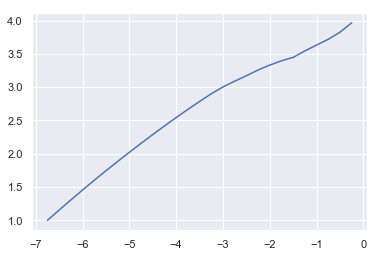

In [63]:
sns.lineplot(log_lrs[5:-5], losses[5:-5])

In [140]:
for e in range(n_epochs):
    model.train()
    # Initialize hidden state
    hidden = model.init_hidden(batch_size)
    train_loss = 0
    count = 0
    for x, y in get_batches(train_notes,batch_size=batch_size,seq_length=seq_length):
        x, y = x.to(device), y.to(device)
        
        print(count,end='\r')
        count += 1
        
        # Creating new variables for the hidden state, otherwise
        # we'd backprop through the entire training history
        hidden = tuple([h.data for h in hidden])

        model.zero_grad()
        
        output, hidden = model(x,hidden)
        
        loss = criterion(output, y.view(batch_size*seq_length))
        loss.backward()
        
        # `clip_grad_norm` helps prevent the exploding gradient problem in RNNs / LSTMs.
        nn.utils.clip_grad_norm_(model.parameters(), clip)
        optim.step()
        
        train_loss += loss.item()
        
    model.eval()
    hidden = model.init_hidden(batch_size)
    valid_loss = 0
    count = 0
    for x,y in get_batches(valid_notes, batch_size=batch_size, seq_length=seq_length):
        x, y = x.to(device), y.to(device)
        
        print(count,end='\r')
        count += 1
        
        hidden = tuple([h.data for h in hidden])
        
        output, hidden = model(x,hidden)
        
        loss = criterion(output, y.view(batch_size*seq_length))
        
        valid_loss += loss.item()

KeyboardInterrupt: 

In [28]:
# Load trained model
model.load_state_dict(torch.load("charrnn_final.pt",map_location='cpu'))

In [29]:
model

CharRNN(
  (embed): Embedding(87, 128)
  (lstm): LSTM(128, 512, num_layers=2, batch_first=True, dropout=0.5)
  (dropout): Dropout(p=0.5)
  (linear): Linear(in_features=512, out_features=87, bias=True)
)

In [32]:
char2int["X"]

49

In [64]:
def forward_single_char(char, hidden):
    #print("char",char)
    inputs = np.array([[char2int[char]]])
    inputs = torch.from_numpy(inputs)
    inputs.to(device)
    
    # detach hidden state from history
    hidden = tuple([h.data for h in hidden])
    # get the output of the model
    out, hidden = model(inputs, hidden)
    
    # get the character probabilities
    prob = F.softmax(out, dim=1).data
    
    
    # get top 5 probabilities
    p, top_ch = prob.topk(5)
    
    p = p.numpy().squeeze()
    top_ch = top_ch.numpy().squeeze()
    # Select next char with some randomness
    char = np.random.choice(top_ch, p=p/p.sum())
    
    return int2char[char], hidden

In [65]:
def predict(size,prime="X"):
    model.eval()
    chars = [c for c in prime]
    
    hidden = model.init_hidden(1)
    for c in chars:
        generated_c, hidden = forward_single_char(c,hidden)
    
    for _ in range(size):
        generated_c, hidden = forward_single_char(chars[-1], hidden)
        chars.append(generated_c)
    
    return "".join(chars)

In [237]:
prediction = predict(1000,prime='B')

**X:1 zorunlu**

In [238]:
intro = """X:1
T:A and D
% Generated Song
S:EF
M:4/4
K:A
M:6/8
P:A"""

intro = """X: 2
T:Abacus
% Nottingham Music Database
S:By Hugh Barwell, via Phil Rowe
M:6/8
K:G"""

In [239]:
prediction

'BGdUkd1A76]&"Gd d l- 6dMd" nGdUkdn- 6dUkd-nUGdUd-""67"-Gd dU U6 :GNNN~E6eeNiEUC6&_TtA=Ng6^\'ooT>tvC!6wY=T]6UCoC5C=ANLE-i&6&C!s6HTC6n-NwEaWaN9EUNwEaWRNIE"N]W07W0GdMdA7]6&" Gd"!d":6]0EGNNN~E6DeNiEL?=6&Cyym\'_ym6XC>7ANg6^\'ooT>tvC!6wY=T]6UCoC5C=ANLEi_C7s6C__6IvTy6X\'bANwEeWRN9EUNUGdUdU:6dUd10AGd d70t6dMdA1AGd"!d7A76d"kd]&"GNdUd7A16707Gd dt7&6dMdA07Gd"!dA7]6d"kd&] GdUd":6\\"0EGNNN~E60PNiE&yCm7m%6XCA_T=Ng6^\'ooT>tvC!6wY=T]6UCoC5C=ANLE9AHT>6&_Ttt=s6HTC6n-NwEeWRN9EUNUGdUdU-"67"-GdUdU-"67"-Gd dU &67& Gd d&:6\\&07GNdMd]7A6A1AGdMdt1t6A7]GdMdA7]6]&"GdMd]0A6d W1d70]6d W1fd&" GNdUdn-U6"0&GNd"kd"&]6A:GdUkd1A161A7GdMd]7t6Al7c]GNd d&0&6&l7&GdMdA:6A016t1tG,NdMdn0A6d kd7]&G,NdMd]0]6A7]GdMdAl7A6t0AGd kd7A767A7Gd d7056517GNdMd]:W]A6tA]Gd d7A767& Gd d7A767& Gd d"&76dUd]&"Gd d&]76dMd]AAGd"!d]7]6dnkd&]&Gd"d":6\\"0EEN&Gd"!dn""6"&7Gd"!dA7]6dUkd7& GNdUkd"&]6U-"GNd&!dd d7076dMd]&"Gd d&0]6d d7A1GNdMdA0]6]7]Gd d&7A6&0&Gd"kd"&]6d d 0"GdMdt0]6]06dn!d&]&Gd"!d"&"6dnkd"l nG,N9E-NdnkdA0A6&07Gd d]&"6&"&Gd d70]67& GNdMdA

In [240]:
prediction_with_intro = intro + prediction

In [241]:
prediction_with_intro

'X: 2\nT:Abacus\n% Nottingham Music Database\nS:By Hugh Barwell, via Phil Rowe\nM:6/8\nK:GBGdUkd1A76]&"Gd d l- 6dMd" nGdUkdn- 6dUkd-nUGdUd-""67"-Gd dU U6 :GNNN~E6eeNiEUC6&_TtA=Ng6^\'ooT>tvC!6wY=T]6UCoC5C=ANLE-i&6&C!s6HTC6n-NwEaWaN9EUNwEaWRNIE"N]W07W0GdMdA7]6&" Gd"!d":6]0EGNNN~E6DeNiEL?=6&Cyym\'_ym6XC>7ANg6^\'ooT>tvC!6wY=T]6UCoC5C=ANLEi_C7s6C__6IvTy6X\'bANwEeWRN9EUNUGdUdU:6dUd10AGd d70t6dMdA1AGd"!d7A76d"kd]&"GNdUd7A16707Gd dt7&6dMdA07Gd"!dA7]6d"kd&] GdUd":6\\"0EGNNN~E60PNiE&yCm7m%6XCA_T=Ng6^\'ooT>tvC!6wY=T]6UCoC5C=ANLE9AHT>6&_Ttt=s6HTC6n-NwEeWRN9EUNUGdUdU-"67"-GdUdU-"67"-Gd dU &67& Gd d&:6\\&07GNdMd]7A6A1AGdMdt1t6A7]GdMdA7]6]&"GdMd]0A6d W1d70]6d W1fd&" GNdUdn-U6"0&GNd"kd"&]6A:GdUkd1A161A7GdMd]7t6Al7c]GNd d&0&6&l7&GdMdA:6A016t1tG,NdMdn0A6d kd7]&G,NdMd]0]6A7]GdMdAl7A6t0AGd kd7A767A7Gd d7056517GNdMd]:W]A6tA]Gd d7A767& Gd d7A767& Gd d"&76dUd]&"Gd d&]76dMd]AAGd"!d]7]6dnkd&]&Gd"d":6\\"0EEN&Gd"!dn""6"&7Gd"!dA7]6dUkd7& GNdUkd"&]6U-"GNd&!dd d7076dMd]&"Gd d&0]6d d7A1GNdMdA0]6]7]Gd d&7A6&0&Gd"kd"&

In [242]:
genererated_song = ParseSongs(prediction_with_intro)

In [243]:
len(genererated_song)

1

In [244]:
genererated_song[0].play()

In [245]:
with open("tmp.abc", "w") as f:
    f.write(prediction_with_intro)

In [246]:
!abc2midi tmp.abc -o tmp.midi

4.23 August 11 2019 abc2midi
Error in line-char 6-0 : Unknown mode 'BGdUkd1A76]&"Gd'
Error in line-char 6-0 : Unknown mode 'd"!d":6]0EGNNN~E6DeNiEL?'
Error in line-char 6-0 : Unknown mode 'dUd":6\"0EGNNN~E60PNiE&yCm7m'
writing MIDI file tmp.midi


In [ ]:
!